<a href="https://colab.research.google.com/github/pythonpypy/pythonpypy/blob/main/Neural_Networks_and_Deep_learning_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Urban 8k Audio Classification Project

## Dataset Description
This dataset contains 8732 labeled sound excerpts (<=4s) of urban sounds from 10 classes: air_conditioner, car_horn, children_playing, dog_bark, drilling, enginge_idling, gun_shot, jackhammer, siren, and street_music. The classes are drawn from the urban sound taxonomy. For a detailed description of the dataset and how it was compiled please refer to the paper.
All excerpts are taken from field recordings uploaded to www.freesound.org. The files are pre-sorted into ten folds (folders named fold1-fold10) to help in the reproduction of and comparison with the automatic classification results reported in the article above.

In addition to the sound excerpts, a CSV file containing metadata about each excerpt is also provided.

**8732 audio files of urban sounds (see description above) in WAV format. The sampling rate, bit depth, and number of channels are the same as those of the original file uploaded to Freesound (and hence may vary from file to file).**

## Task Description
The Dataset contains 10 classes, we will do a classification task on the audio files.
```
A numeric identifier of the sound class:
0 = air_conditioner
1 = car_horn
2 = children_playing
3 = dog_bark
4 = drilling
5 = engine_idling
6 = gun_shot
7 = jackhammer
8 = siren
9 = street_music
```



## How to get the Urban8K Dataset?
Just go to [Urban8K Website](https://urbansounddataset.weebly.com/urbansound8k.html) and fill a simple form to download the dataset. Since the dataset is > 5GB in compressed form itself, it's better to copy the download link and directly !wget it to the colab and move to the drive for further use.

### Code Block Below Downloads the Dataset and Unzips the tarball, this might take a while to download and unzip.

In [ ]:
!wget https://goo.gl/8hY5ER
!tar -xvf 8hY5ER -C ./

--2020-12-16 17:48:45--  https://goo.gl/8hY5ER
Resolving goo.gl (goo.gl)... 64.233.170.102, 64.233.170.113, 64.233.170.101, ...
Connecting to goo.gl (goo.gl)|64.233.170.102|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://zenodo.org/record/1203745/files/UrbanSound8K.tar.gz [following]
--2020-12-16 17:48:46--  https://zenodo.org/record/1203745/files/UrbanSound8K.tar.gz
Resolving zenodo.org (zenodo.org)... 137.138.76.77
Connecting to zenodo.org (zenodo.org)|137.138.76.77|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6023741708 (5.6G) [application/octet-stream]
Saving to: ‘8hY5ER’

8hY5ER              100%[===================>]   5.61G  7.08MB/s    in 10m 55s 

2020-12-16 17:59:42 (8.77 MB/s) - ‘8hY5ER’ saved [6023741708/6023741708]

tar: .: Not found in archive
tar: Exiting with failure status due to previous errors


* Mount Google Drive, Create a Folder named Urban8KZip in it.
* Copy the unzipped urban8kzipped contents to the Urban8KZip Directory

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [58]:
!mkdir /content/drive/MyDrive/Urban8KZip
!cp ./8hY5ER /content/drive/MyDrive/Urban8KZip

mkdir: cannot create directory ‘/content/drive/MyDrive/Urban8KZip’: File exists
cp: cannot stat './8hY5ER': No such file or directory


### In case of running notebook again,

If you do run notebook again there is no reason to download dataset again and move to drive, just mount the drive and copy the content from the Urban8KZip folder to the colab.

**Run this next cell if running the notebook again, Don't run the above cell and downloading cells(in starting), just mount the colab and run the next cell.**

In [12]:
!tar -xvf /content/drive/MyDrive/Urban8KZip/8hY5ER -C ./

Streaming output truncated to the last 5000 lines.
UrbanSound8K/audio/fold4/17480-2-0-6.wav
UrbanSound8K/audio/fold4/17480-2-0-9.wav
UrbanSound8K/audio/fold4/175904-2-0-11.wav
UrbanSound8K/audio/fold4/175904-2-0-24.wav
UrbanSound8K/audio/fold4/176003-1-0-0.wav
UrbanSound8K/audio/fold4/176638-5-0-0.wav
UrbanSound8K/audio/fold4/177756-2-0-10.wav
UrbanSound8K/audio/fold4/177756-2-0-4.wav
UrbanSound8K/audio/fold4/177756-2-0-5.wav
UrbanSound8K/audio/fold4/177756-2-0-7.wav
UrbanSound8K/audio/fold4/179862-1-0-0.wav
UrbanSound8K/audio/fold4/180977-3-1-1.wav
UrbanSound8K/audio/fold4/180977-3-1-5.wav
UrbanSound8K/audio/fold4/183989-3-1-21.wav
UrbanSound8K/audio/fold4/183989-3-1-23.wav
UrbanSound8K/audio/fold4/185709-0-0-0.wav
UrbanSound8K/audio/fold4/185709-0-0-1.wav
UrbanSound8K/audio/fold4/185709-0-0-6.wav
UrbanSound8K/audio/fold4/185709-0-0-7.wav
UrbanSound8K/audio/fold4/185909-2-0-102.wav
UrbanSound8K/audio/fold4/185909-2-0-13.wav
UrbanSound8K/audio/fold4/185909-2-0-17.wav
UrbanSound8K/audio

## Data Analysis, Exploration and Visualizations

### Some Information About Dataset.
This dataset has audio belonging to 10 classes, unlike images Audio data is different, it's similar in some senses but there are certain differences which are unique to audio data.

Before even using audio file dataset, the first challenge in itself is that audio files are continous data and our computers can only store discrete data, so in what way we digitize it such that we can easily store.

Apparently the solution is that we figure out a way that is discrete yet continous. Sounds misleading but what we do is  <b>instead of storing continous value, we just sample it at fixed durations like 0.2 second apart or less or more<b>. We just sample it and the rate at which it is sampled is known as **Sampling rate**.

<figure>
  <img src="https://cdn.analyticsvidhya.com/wp-content/uploads/2017/08/23210623/sound.png" width="350" alt="my img"/>
  <figcaption> Image Courtesy Analytics Vidhya </figcaption>
</figure>

When we say we sample it, what are we actually doing?
> We are recording the amplitude at that point.


* So the audio data is nothing just the amplitude stored at regular intervals which mimic the original continous wave.

* We take and store thousands of measurements per second. If we can take tons of measurements extremely quickly with enough possible amplitude values, we can effectively use these snapshots to reconstruct the resolution and complexity of an analog wave.


<figure>
  <img src="https://www.izotope.com/en/learn/digital-audio-basics-sample-rate-and-bit-depth/_jcr_content/root/sectioncontainer_main/flexcontainer/flexcontainer_center/flexcontainer_center_top/image_1558274996.coreimg.82.1280.jpeg/1590799241393/reconstructing-the-original-signal.jpeg
" width= "500" alt="my img"/>
  <figcaption> Image Courtesy izotope </figcaption>
</figure>

* [Read more about the audio concepts involved such as bit depth and nyquist rate](https://www.izotope.com/en/learn/digital-audio-basics-sample-rate-and-bit-depth.html)


In [13]:
!pip install librosa

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [14]:
import IPython.display as ipd #Allows Audio files to be played directly in the notebook
import librosa #library we will use to analyze sounds
import librosa.display #library module which helps visualize the waves

In [15]:
import os
import glob
import numpy as np
import pandas as pd
import random

import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

### Reading audio files

In [16]:
# Recursively find the files that end with .wav extension in the provided path
audios = glob.glob(os.path.join("/content/UrbanSound8K/audio/*/*.wav"), recursive=True)

print(f"Total Audio Files : {len(audios)}")

Total Audio Files : 8732


In [17]:
audios[:5] #Contains path of all audios

['/content/UrbanSound8K/audio/fold9/207211-2-0-100.wav',
 '/content/UrbanSound8K/audio/fold9/177620-3-0-21.wav',
 '/content/UrbanSound8K/audio/fold9/180937-4-1-30.wav',
 '/content/UrbanSound8K/audio/fold9/54823-3-0-0.wav',
 '/content/UrbanSound8K/audio/fold9/105029-7-0-4.wav']

### Hit the play icon below and listen to the sound, try to remember the sound and the plot generated do it several times and try to pick up  the pattern yourself.

To read audio files, we will be using,

```python
data, sample_rate = librosa.load(audio_path)
```

librosa by default reads the audio file at sr(sampling rate) = 22050, if you want your custom sampling here, you can pass sr = your_rate in the librosa.load function.

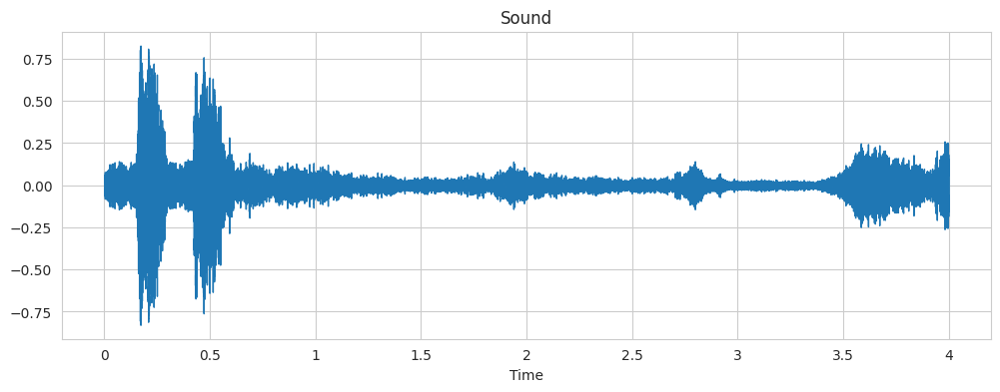

In [18]:
plt.figure(figsize=(12,4))

play_audio = random.choice(audios)
data, sample_rate = librosa.load(play_audio)
librosa.display.waveshow(data)
plt.title("Sound")
ipd.Audio(play_audio)

#### **If you managed to pick up patterns, you can see it becomes a visual problem as well. Just a thought.**

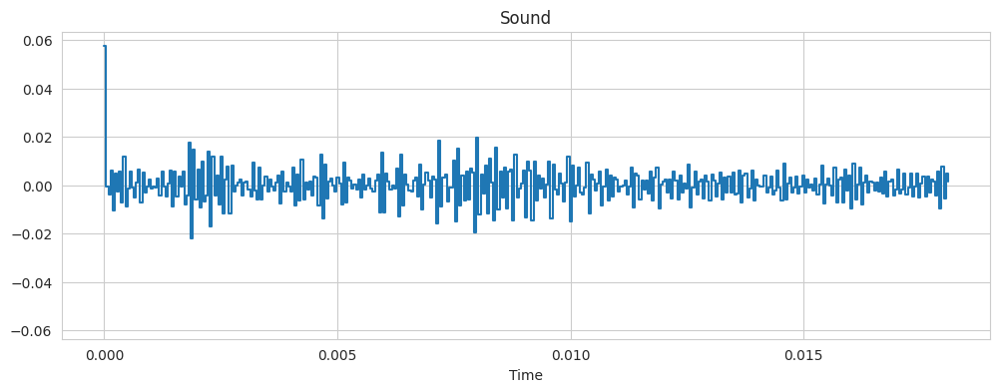

In [19]:
plt.figure(figsize=(12,4))
play_audio = random.choice(audios)
data, sample_rate = librosa.load(play_audio, sr=100)
librosa.display.waveshow(data)
plt.title("Sound")
ipd.Audio(play_audio)

### Plotting same audio at different sampling rate

Higher the sampling rate, higher the crisp of plot because less error while trying to recreate original audio with higher number of samples and vice versa.

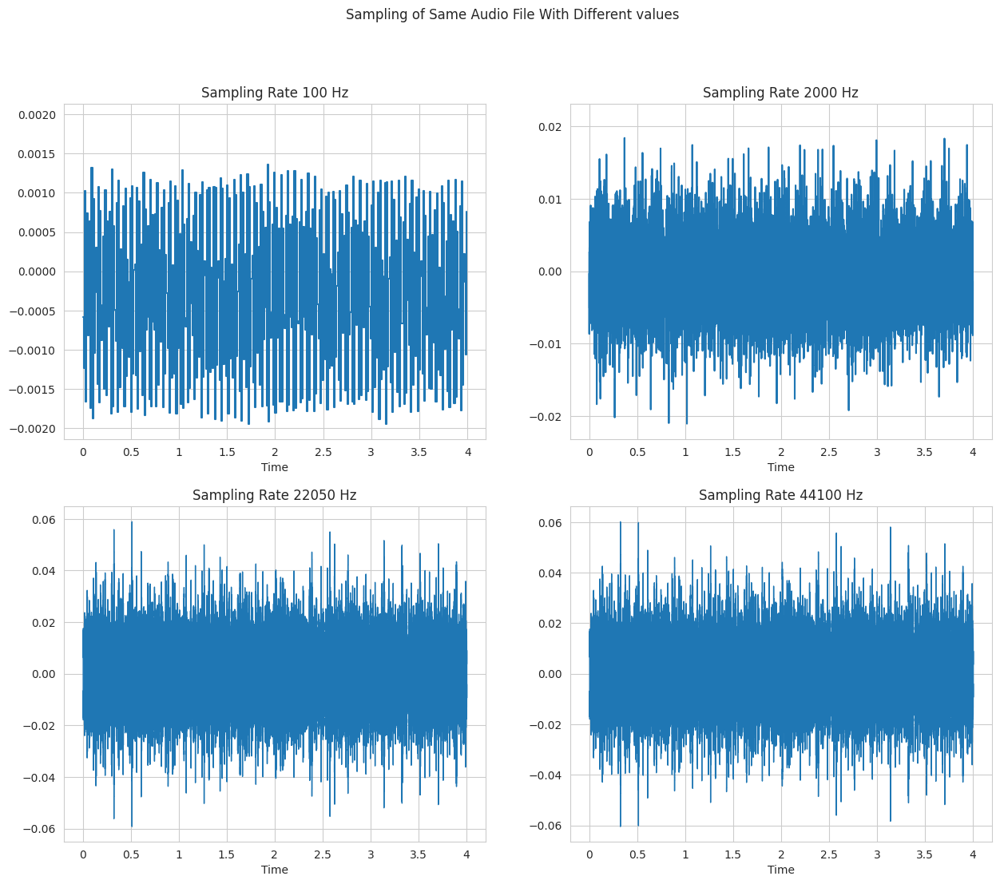

In [20]:
fig, axs = plt.subplots(2,2, figsize=(15,12))
fig.suptitle("Sampling of Same Audio File With Different values")
axs = np.reshape(axs,-1)
play_audio = random.choice(audios)
srs = [100, 2000, 22050, 44100]
for ax,sr in zip(axs,srs):
  try:
    data, sample_rate = librosa.load(play_audio, sr=sr)
    librosa.display.waveshow(data, sr=sample_rate, ax=ax)
    ax.set_title(f"Sampling Rate {sr} Hz")
  except:
    print("Run Again Some Unknown Error")

ipd.Audio(play_audio)

### Reading Metadata for the dataset

In [21]:
metadata = pd.read_csv("/content/UrbanSound8K/metadata/UrbanSound8K.csv")

metadata.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


#### Anatomy of Metadata csv
* UrbanSound8K the main dataset directory contains two folders audio and metadata, the audio folder is where all the audio files are located, if you are running this in colab on right if you click on the UrbanSound8K Folder, you can see that it has the said two folders by clicking on it.
* audio folder in itself contains 10 folders named fold1, fold2 ..... fold10. These folds contains audio files details of which are mentioned in above the csv or dataframe.

* If we join "UrbanSound8K/audio/" + "fold" + fold_value(1/2/...10) + slice_file_name it becomes path for the audio file as well.(This logic will be implemented later, keep it in mind till then.)

#### Selecting random row for each class in metadata

In [22]:
unique_audios = metadata.groupby(['class']).apply(lambda sub_df : sub_df.sample()).reset_index(drop = True)

In [23]:
unique_audios.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,189989-0-0-1.wav,189989,0.500000,4.500000,1,9,0,air_conditioner
1,171249-1-0-0.wav,171249,6.670459,7.433059,2,4,1,car_horn
2,133090-2-0-70.wav,133090,35.000000,39.000000,1,8,2,children_playing
3,68389-3-1-0.wav,68389,5.356664,5.964054,1,4,3,dog_bark
4,205610-4-0-3.wav,205610,1.672531,5.672531,1,8,4,drilling


#### Plotting selected rows

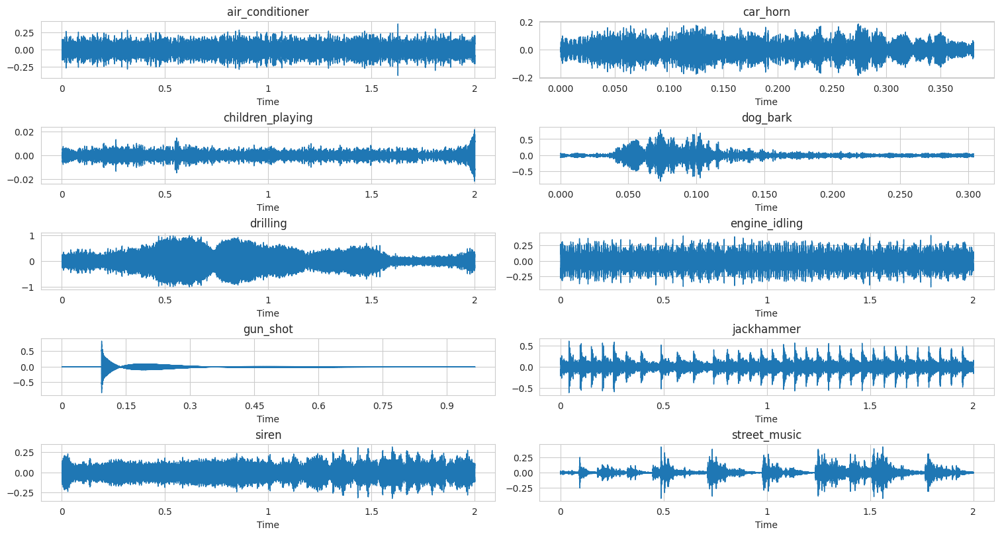

In [24]:
fig, axs = plt.subplots(5,2,figsize=(15,8),constrained_layout=True)
axs = np.reshape(axs, -1)

for (index,row),ax in zip(unique_audios.iterrows(),axs):
  ax.set_title(row.values[-1])
  data, sr = librosa.load(f"/content/UrbanSound8K/audio/fold{row.values[-3]}/" + row.values[0])
  _ = librosa.display.waveshow(data, sr=sample_rate, ax=ax)

#### Let's see the number of instances for each class

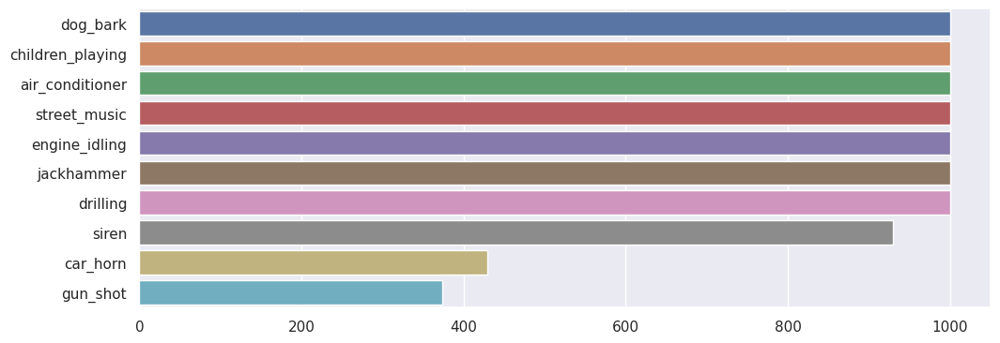

In [25]:
instance_counts = metadata['class'].value_counts()
sns.set(rc={'figure.figsize':(11.7,4.14)})
sns.barplot(x=instance_counts.values, y=instance_counts.index, orient='h');

* Apart from car_horn and gun_shot class all of the classes appear to be balanced, this might be a problem we will try to address later.

### [Characterstics of Wave Audio File](http://soundfile.sapp.org/doc/WaveFormat/)

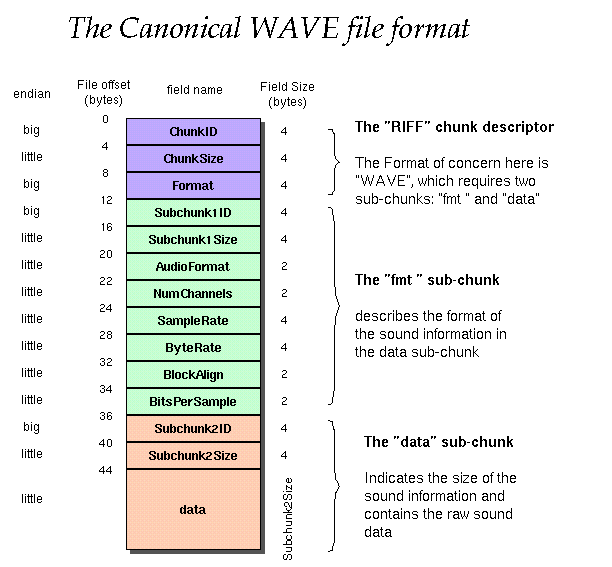

In [26]:
import struct

def read_file_properties(filename):
  wave_file = open(filename,"rb")
        
  riff = wave_file.read(12)
  fmt = wave_file.read(36)
  
  num_channels_string = fmt[10:12]
  num_channels = struct.unpack('<H', num_channels_string)[0]

  sample_rate_string = fmt[12:16]
  sample_rate = struct.unpack("<I",sample_rate_string)[0]
  
  bit_depth_string = fmt[22:24]
  bit_depth = struct.unpack("<H",bit_depth_string)[0]

  return (num_channels, sample_rate, bit_depth)

In [27]:
audio_properties = []
for index,row in metadata.iterrows():
  file_name = os.path.join(*["/content/UrbanSound8K/audio", f"fold{row.values[-3]}", row.values[0]])
  audio_properties.append(read_file_properties(file_name))

In [28]:
audiodf = pd.DataFrame(audio_properties, columns=['num_channels','sample_rate','bit_depth'])

audiodf.head()

,num_channels,sample_rate,bit_depth
0,2,44100,16
1,2,44100,16
2,2,44100,16
3,2,44100,16
4,2,44100,16


#### Number of channels in audio files

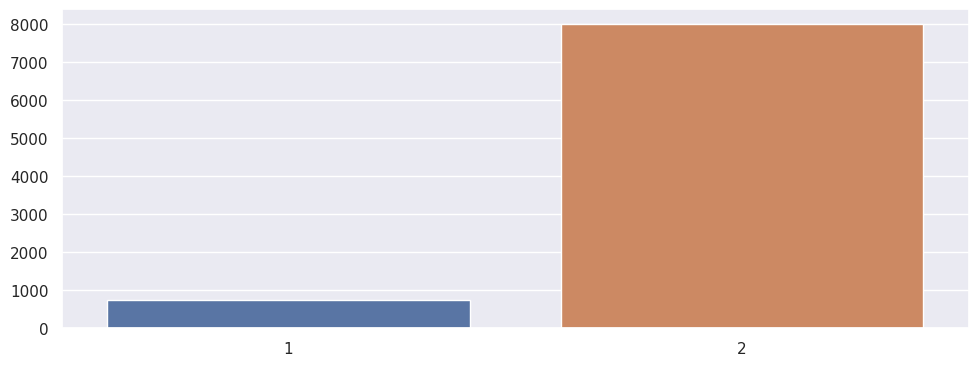

In [29]:
channels_data = audiodf['num_channels'].value_counts()
sns.barplot(x=channels_data.index, y=channels_data.values);

#### Original Sample Rate of Audio Files

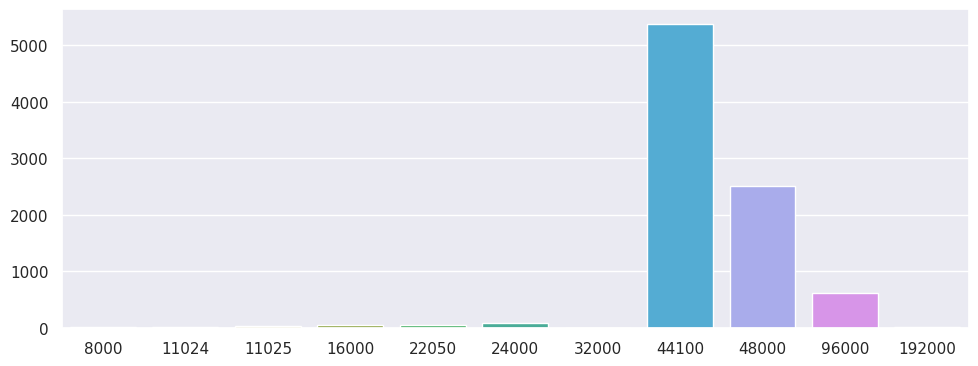

In [30]:
channels_data = audiodf['sample_rate'].value_counts()
sns.barplot(x=channels_data.index, y=channels_data.values);

#### Bit Depth of Audio Files

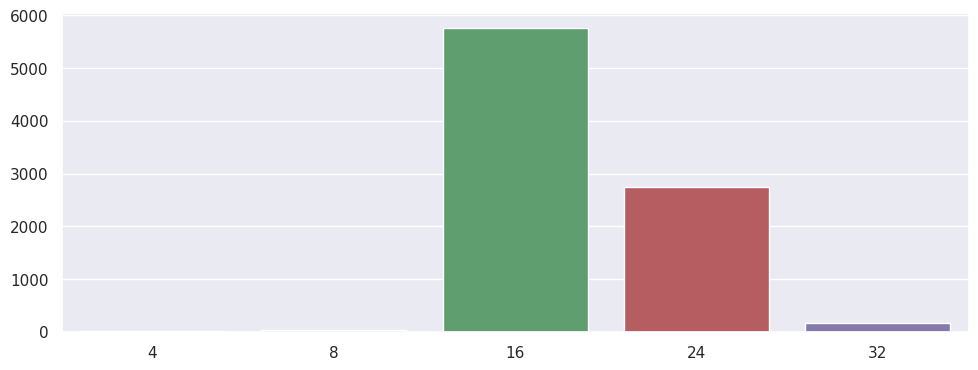

In [31]:
channels_data = audiodf['bit_depth'].value_counts()
sns.barplot(x=channels_data.index, y=channels_data.values);

### Librosa vs Scipy - Data Visualization

The stark contrast and why Librosa is the preferred library was observed due to following reasons:
* Librosa by default reads audio file at fix sampling rate of 22050 hz.
* Librosa reads all audio files(4,8,16....) at fix depth rate of 16
* Librosa reads all audio files(stereo/mono) at fix num_channels = 1(stereo)

In [32]:
from scipy.io import wavfile as wav

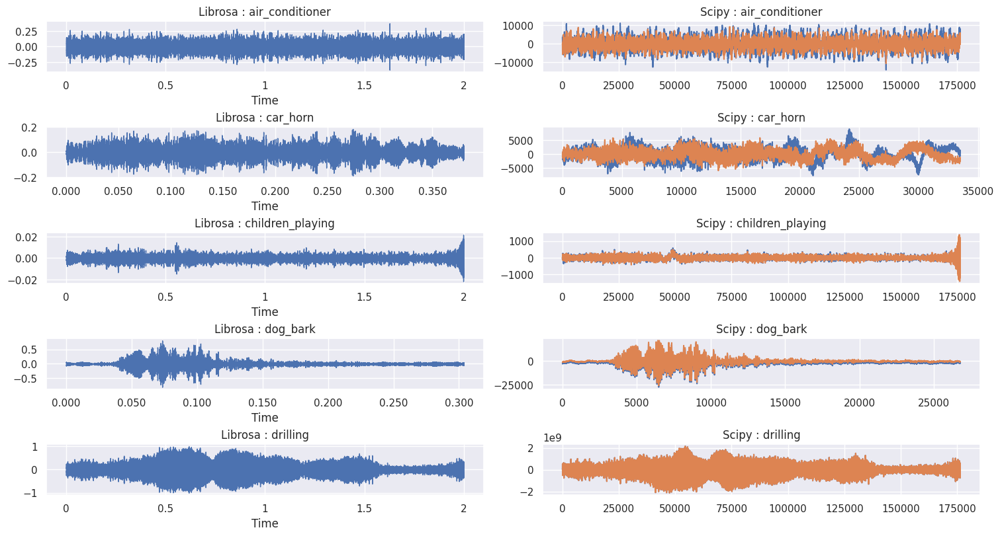

In [33]:
unique_audios_5 = unique_audios.head()
fig, axs = plt.subplots(5,2,figsize=(15,8),constrained_layout=True)

for (index,row),ax in zip(unique_audios_5.iterrows(),axs):
  
  file_path = f"/content/UrbanSound8K/audio/fold{row.values[-3]}/" + row.values[0]
  ax[0].set_title(f"Librosa : {row.values[-1]}")
  data, sr = librosa.load(file_path)
  _ = librosa.display.waveshow(data, sr=sample_rate, ax=ax[0])

  try:
    scipy_sample_rate, scipy_audio = wav.read(file_path)
    ax[1].set_title(f"Scipy : {row.values[-1]}")
    ax[1].plot(scipy_audio) 
  except:
    pass

### **What is this mfcc and why are we using it?**

> MFCCs are essentially like taking a Fourier Transform of the signal, however, MFCCs use Mel scaling to try to model the way that the human hearing audiotory system perceives sounds, rather than describe them on a purely frequency (Hz) basis. This means that the MFCC should represent the textural or timbre of the signal (the baby cry) as we might hear it (e.g. a 'piercing' cry or a 'discontent' cry).


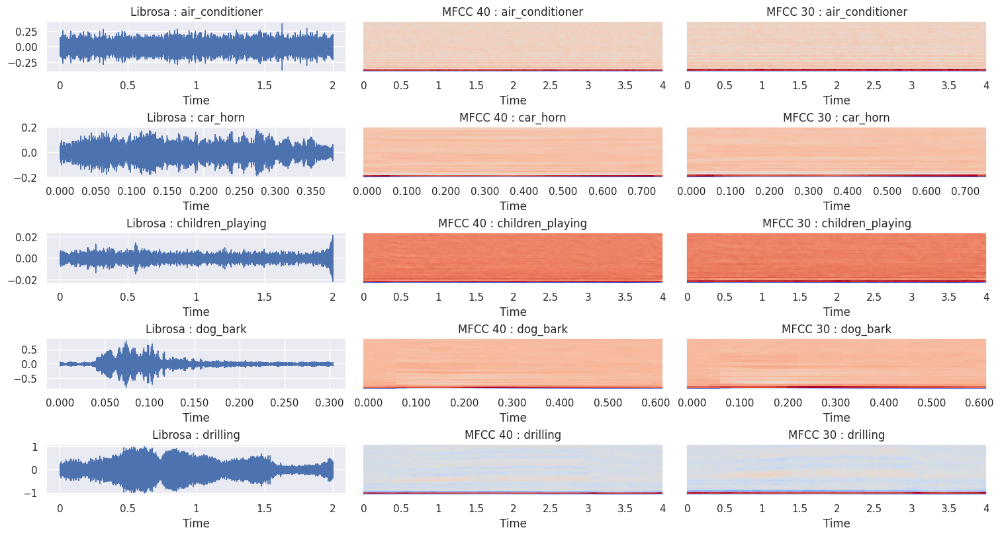

In [34]:
unique_audios_5 = unique_audios.head()
fig, axs = plt.subplots(5,3,figsize=(15,8),constrained_layout=True)

for (index,row),ax in zip(unique_audios_5.iterrows(),axs):
  
  file_path = f"/content/UrbanSound8K/audio/fold{row.values[-3]}/" + row.values[0]
  ax[0].set_title(f"Librosa : {row.values[-1]}")
  data, sr = librosa.load(file_path)
  _ = librosa.display.waveshow(data, sr=sample_rate, ax=ax[0])

  ax[1].set_title(f"MFCC 40 : {row.values[-1]}")
  mfccs = librosa.feature.mfcc(y =data, n_mfcc= 40)
  librosa.display.specshow(mfccs, x_axis='time', ax=ax[1])

  ax[2].set_title(f"MFCC 30 : {row.values[-1]}")
  mfccs = librosa.feature.mfcc(y =data, n_mfcc= 30)
  librosa.display.specshow(mfccs, x_axis='time', ax=ax[2])

In [35]:
def extract_features(file_name, n_mfcc=40):
   
    try:
        audio, sample_rate = librosa.load(file_name) 
        mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=n_mfcc)
        mfccsscaled = np.mean(mfccs.T,axis=0)
        
    except Exception as e:
        print("Error encountered while parsing file: ", file)
        return None 
    return mfccsscaled

In [36]:
#Takes time
from tqdm.notebook import tqdm 

features = []
for index,row in tqdm(metadata.iterrows()):
    file_path = f"/content/UrbanSound8K/audio/fold{row.values[-3]}/" + row.values[0]
    class_label = row.values[-1]
    try:
      data = extract_features(file_path)
      features.append([data, class_label])
    except:
      pass
      

featuresdf = pd.DataFrame(features, columns=['feature','class_label'])

0it [00:00, ?it/s]

/usr/local/lib/python3.9/dist-packages/librosa/core/spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=1323
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/librosa/core/spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=1103
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/librosa/core/spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=1523
  warnings.warn(


In [37]:
featuresdf[featuresdf.feature.notnull()]

,feature,class_label
0,"[-211.93698, 62.581215, -122.813156, -60.74529...",dog_bark
1,"[-417.0052, 99.336624, -42.995586, 51.073326, ...",children_playing
2,"[-452.39316, 112.36253, -37.578075, 43.195866,...",children_playing
3,"[-406.47922, 91.1966, -25.043556, 42.78452, 11...",children_playing
4,"[-439.63873, 103.86223, -42.658787, 50.690285,...",children_playing
...,...,...
8727,"[-391.3721, 125.36239, -40.634056, 25.899754, ...",car_horn
8728,"[-339.42715, 76.409096, -35.30988, 41.984035, ...",car_horn
8729,"[-297.31534, 102.09026, -36.75108, 26.816488, ...",car_horn
8730,"[-336.92386, 115.3139, -44.84709, 24.968985, -...",car_horn


In [38]:
featuresdf['class_label'] = pd.Categorical(featuresdf['class_label'])
featuresdf['class_category'] = featuresdf['class_label'].cat.codes

featuresdf['feature_len'] = featuresdf['feature'].apply(lambda x: len(x))

In [39]:
featuresdf.head()

,feature,class_label,class_category,feature_len
0,"[-211.93698, 62.581215, -122.813156, -60.74529...",dog_bark,3,40
1,"[-417.0052, 99.336624, -42.995586, 51.073326, ...",children_playing,2,40
2,"[-452.39316, 112.36253, -37.578075, 43.195866,...",children_playing,2,40
3,"[-406.47922, 91.1966, -25.043556, 42.78452, 11...",children_playing,2,40
4,"[-439.63873, 103.86223, -42.658787, 50.690285,...",children_playing,2,40


In [40]:
featuresdf.to_json("features.json", orient='records')
!cp ./features.json /content/drive/MyDrive/Urban8KZip/

In [41]:
!cp /content/drive/MyDrive/Urban8KZip/features.json ./

In [42]:
import pandas as pd
featuresdf = pd.read_json("features.json", orient='records')

In [43]:
featuresdf.head()

,feature,class_label,class_category,feature_len
0,"[-211.9369812012, 62.5812149048, -122.81315612...",dog_bark,3,40
1,"[-417.0051879883, 99.3366241455, -42.995586395...",children_playing,2,40
2,"[-452.393157959, 112.3625335693, -37.578075408...",children_playing,2,40
3,"[-406.4792175293, 91.1966018677, -25.043556213...",children_playing,2,40
4,"[-439.6387329102, 103.8622283936, -42.65878677...",children_playing,2,40


In [44]:
featuresdf.class_category.unique()

array([3, 2, 1, 0, 9, 6, 8, 5, 7, 4])

## Model Building & Training

### Converting Data to Required Format

In [45]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import torchvision

from torch.utils.data import TensorDataset,DataLoader

The Data is not in the desired format, we will do the follow the steps to convert it in our required format.
1. Split Dataset using sklearn
2. Convert the split data into torch tensors
3. Convert the torch tensors into Tensor Datasets.
4. Created DataLoaders from these Tensor Datasets.

#### 1. Splitting Dataset using sklearn

In [46]:
from sklearn.model_selection import train_test_split 
X = featuresdf.feature
y = featuresdf.class_category
x_train, x_test, y_train, y_test = train_test_split(list(X.values), list(y.values), test_size=0.2, random_state = 42, stratify=y)

In [47]:


x_train_base = x_train
x_test_base = x_test

#### 2. Converting Data into Torch tensors

In [48]:
import numpy as np

x_train = np.array(x_train_base)
x_test = np.array(x_test_base)

y_train = np.array(y_train)
y_test = np.array(y_test)

In [49]:
x_train_tensor = torch.tensor(x_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)


x_test_tensor = torch.tensor(x_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

In [50]:
print(x_train_tensor.type(),y_train_tensor.type())

torch.FloatTensor torch.LongTensor


#### 3,4 Converting into TensorDataset and feeding it to DataLoader

In [51]:
train_dataset = TensorDataset(x_train_tensor,y_train_tensor)
test_dataset = TensorDataset(x_test_tensor,y_test_tensor)

train_dl = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_dl = DataLoader(test_dataset, batch_size=64*2)

### Model Building

#### Fixing Input and Output Size

In [52]:
input_size = 40
output_size = featuresdf['class_category'].nunique()

In [53]:
output_size

10

#### Model

Github gist for base and top models

In [54]:
!git clone https://gist.github.com/601213329b8c7b0a4b69cc8b6f3a7010.git
!mv ./601213329b8c7b0a4b69cc8b6f3a7010/* ./
!rm -rf ./601213329b8c7b0a4b69cc8b6f3a7010

Cloning into '601213329b8c7b0a4b69cc8b6f3a7010'...
remote: Enumerating objects: 31, done.
remote: Total 31 (delta 0), reused 0 (delta 0), pack-reused 31
Unpacking objects: 100% (31/31), 3.63 KiB | 743.00 KiB/s, done.


#### Model Loading Zone

In [55]:
from model_nn_3_layers_simple import NNModel_3Layers

In [56]:
from model_nn_4_layers_simple import NNModel_4Layers

In [57]:
from model_nn_5_layers_simple import NNModel_5Layers

In [58]:
from model_nn_6_layers_simple import NNModel_6Layers

In [59]:
model_4_layers = NNModel_4Layers(input_size, output_size)

### Model Training

#### Accuracy and Loss Before Training

In [60]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [61]:
model_4_layers.eval()
valid_history = model_4_layers.evaluate_validation(test_dl, device)
acc = torch.stack([valid['val_acc'] for valid in valid_history]).mean().item()
loss = torch.stack([valid['val_loss'] for valid in valid_history]).mean().item()

print(f"Accuracy : {acc:.3f}, Loss : {loss:.3f}")

Accuracy : 0.124, Loss : 2.966


#### Fit Function

In [62]:
def fit(model,train_dataloader, valid_dataloader, n_epochs,lr = 0.001, optim = torch.optim.Adam, device = device):
  model_history = {'train_loss' : [], 'valid_loss' : [], 'train_acc' : [], 'valid_acc' : []}
  optimizer = optim(model.parameters(), lr)

  for epoch in range(n_epochs):
    model.train()
    train_loss = []
    train_accuracy = []

    for image_label_batch in train_dataloader:
      image, label = image_label_batch[0].to(device), image_label_batch[1].to(device)
      loss_acc = model.training_step((image, label))
      loss = loss_acc['loss']
      acc = loss_acc['acc']
      loss.backward()
      train_loss.append(loss)
      train_accuracy.append(acc)

      optimizer.step()
      optimizer.zero_grad()
    
    model.eval()
    
    with torch.no_grad():
        val_history = model.evaluate_validation(valid_dataloader, device)
        result = model.epoch_end(val_history)

    model_history['train_loss'].append(torch.stack(train_loss).mean().item())
    model_history['valid_loss'].append(result['val_loss'])
    model_history['train_acc'].append(torch.stack(train_accuracy).mean().item())
    model_history['valid_acc'].append(result['val_acc'])
    print(f"Epoch : {epoch}, Train Loss : {model_history['train_loss'][-1]:.2f}, Train Accuracy : {model_history['train_acc'][-1]:.2f}, Validation Loss : {result['val_loss']:.2f}, Validation Accuracy : {result['val_acc']:.2f}")


  return model_history

In [63]:
import matplotlib.pyplot as plt

#### Test Case : n_epoch = 300, lr=0.001, SGD, final_acc = 18%

In [64]:
history = fit(model_4_layers, train_dl, test_dl, 300, 0.001, optim = torch.optim.SGD, device = device)

Epoch : 0, Train Loss : 2.42, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 1, Train Loss : 2.31, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 2, Train Loss : 2.31, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 3, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 4, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 5, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.12
Epoch : 6, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.12
Epoch : 7, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.12
Epoch : 8, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.12
Epoch : 9, Train Loss : 2.30, Train Accuracy : 0.12, Validation 

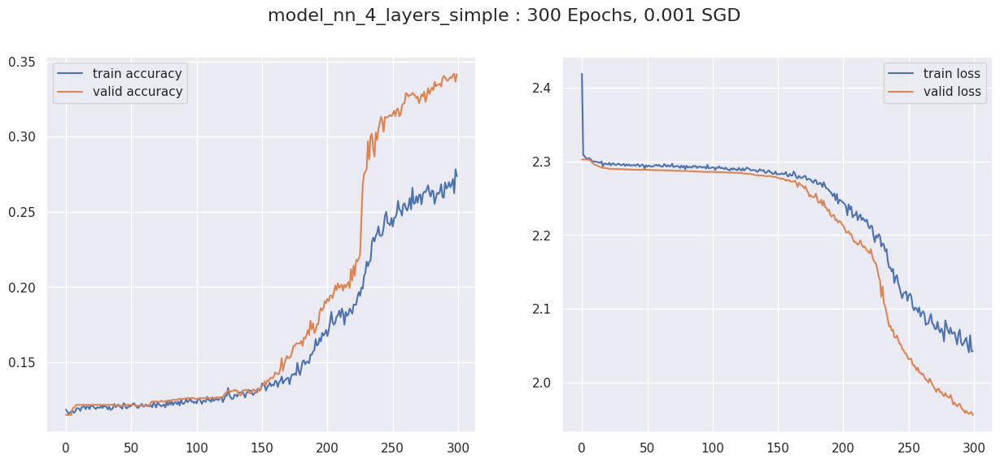

In [65]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,6))

fig.suptitle(f"model_nn_4_layers_simple : 300 Epochs, 0.001 SGD", fontsize=16)
ax1.plot(history['train_acc'], label='train accuracy')
ax1.plot(history['valid_acc'], label='valid accuracy')
ax1.legend()


ax2.plot(history['train_loss'], label='train loss')
ax2.plot(history['valid_loss'], label='valid loss')
ax2.legend()

fig.show()

#### Test Case : n_epoch = 1000, lr=0.001, SGD, final_acc = 74%

In [66]:
model_4_layers = NNModel_4Layers(input_size, output_size)
history2 = fit(model_4_layers, train_dl, test_dl, 1000, 0.001, optim=torch.optim.SGD, device = device)

Epoch : 0, Train Loss : 2.44, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 1, Train Loss : 2.31, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 2, Train Loss : 2.31, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 3, Train Loss : 2.31, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 4, Train Loss : 2.30, Train Accuracy : 0.11, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 5, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 6, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 7, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 8, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 9, Train Loss : 2.30, Train Accuracy : 0.12, Validation 

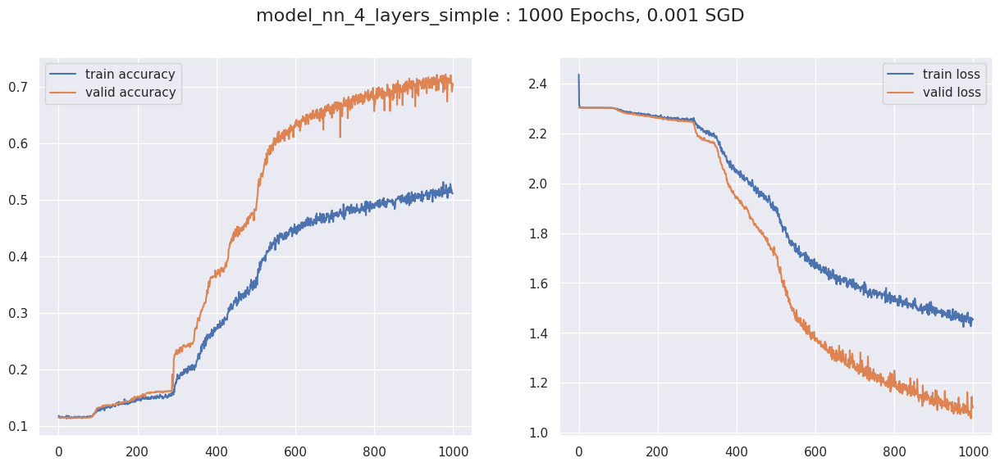

In [67]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,6))

fig.suptitle(f"model_nn_4_layers_simple : 1000 Epochs, 0.001 SGD", fontsize=16)
ax1.plot(history2['train_acc'], label='train accuracy')
ax1.plot(history2['valid_acc'], label='valid accuracy')
ax1.legend()


ax2.plot(history2['train_loss'], label='train loss')
ax2.plot(history2['valid_loss'], label='valid loss')
ax2.legend()

fig.show()

#### Test Case : n_epoch = 500, lr=0.01, SGD, final_acc = 73%

In [68]:
model_4_layers = NNModel_4Layers(input_size, output_size)
history3 = fit(model_4_layers, train_dl, test_dl, 500, 0.01, optim=torch.optim.SGD)

Epoch : 0, Train Loss : 2.34, Train Accuracy : 0.11, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 1, Train Loss : 2.30, Train Accuracy : 0.11, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 2, Train Loss : 2.30, Train Accuracy : 0.11, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 3, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 4, Train Loss : 2.30, Train Accuracy : 0.11, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 5, Train Loss : 2.30, Train Accuracy : 0.11, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 6, Train Loss : 2.30, Train Accuracy : 0.11, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 7, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 8, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 9, Train Loss : 2.30, Train Accuracy : 0.11, Validation 

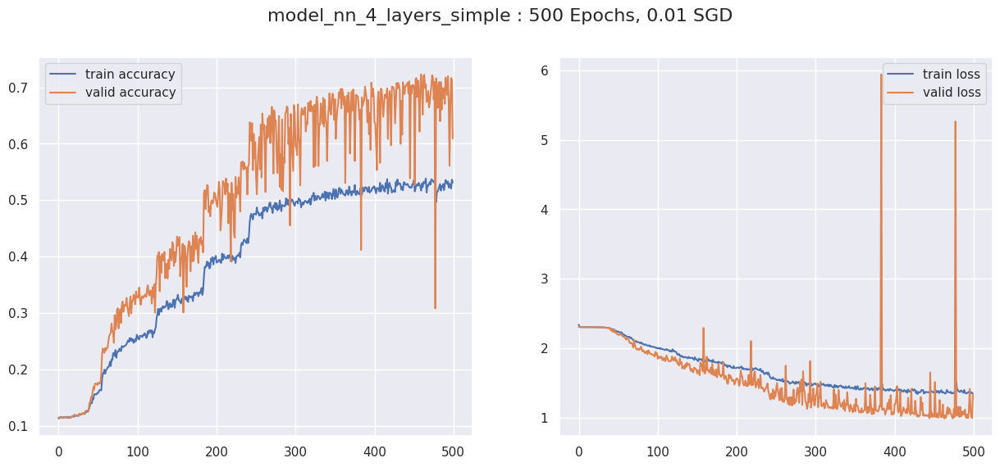

In [69]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,6))

fig.suptitle(f"model_nn_4_layers_simple : 500 Epochs, 0.01 SGD", fontsize=16)
ax1.plot(history3['train_acc'], label='train accuracy')
ax1.plot(history3['valid_acc'], label='valid accuracy')
ax1.legend()


ax2.plot(history3['train_loss'], label='train loss')
ax2.plot(history3['valid_loss'], label='valid loss')
ax2.legend()

fig.show()

In [70]:
model_5_layers = NNModel_5Layers(input_size, output_size)
history4 = fit(model_5_layers, train_dl, test_dl, 500, 0.01, optim=torch.optim.SGD)

Epoch : 0, Train Loss : 2.31, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.12
Epoch : 1, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.12
Epoch : 2, Train Loss : 2.30, Train Accuracy : 0.13, Validation Loss : 2.28, Validation Accuracy : 0.12
Epoch : 3, Train Loss : 2.29, Train Accuracy : 0.14, Validation Loss : 2.28, Validation Accuracy : 0.18
Epoch : 4, Train Loss : 2.27, Train Accuracy : 0.17, Validation Loss : 2.22, Validation Accuracy : 0.23
Epoch : 5, Train Loss : 2.23, Train Accuracy : 0.20, Validation Loss : 2.17, Validation Accuracy : 0.25
Epoch : 6, Train Loss : 2.21, Train Accuracy : 0.21, Validation Loss : 2.16, Validation Accuracy : 0.23
Epoch : 7, Train Loss : 2.18, Train Accuracy : 0.23, Validation Loss : 2.13, Validation Accuracy : 0.26
Epoch : 8, Train Loss : 2.15, Train Accuracy : 0.25, Validation Loss : 2.08, Validation Accuracy : 0.28
Epoch : 9, Train Loss : 2.12, Train Accuracy : 0.27, Validation 

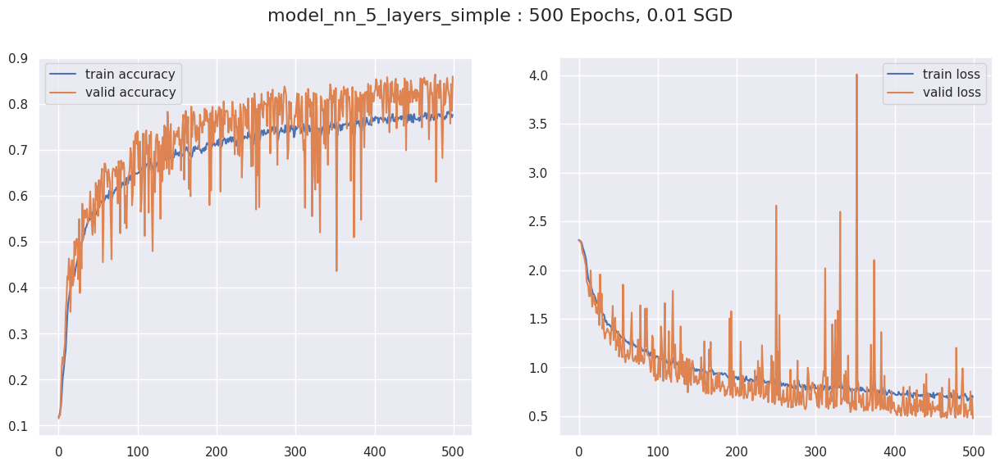

In [71]:

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,6))

fig.suptitle(f"model_nn_5_layers_simple : 500 Epochs, 0.01 SGD", fontsize=16)
ax1.plot(history4['train_acc'], label='train accuracy')
ax1.plot(history4['valid_acc'], label='valid accuracy')
ax1.legend()


ax2.plot(history4['train_loss'], label='train loss')
ax2.plot(history4['valid_loss'], label='valid loss')
ax2.legend()

fig.show()

In [72]:
model_3_layers = NNModel_3Layers(input_size, output_size)
history5 = fit(model_3_layers, train_dl, test_dl, 500, 0.001, optim=torch.optim.SGD)

Epoch : 0, Train Loss : 2.50, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 1, Train Loss : 2.31, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 2, Train Loss : 2.31, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.11
Epoch : 3, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.12
Epoch : 4, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.12
Epoch : 5, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.12
Epoch : 6, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.12
Epoch : 7, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.12
Epoch : 8, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.12
Epoch : 9, Train Loss : 2.29, Train Accuracy : 0.13, Validation 

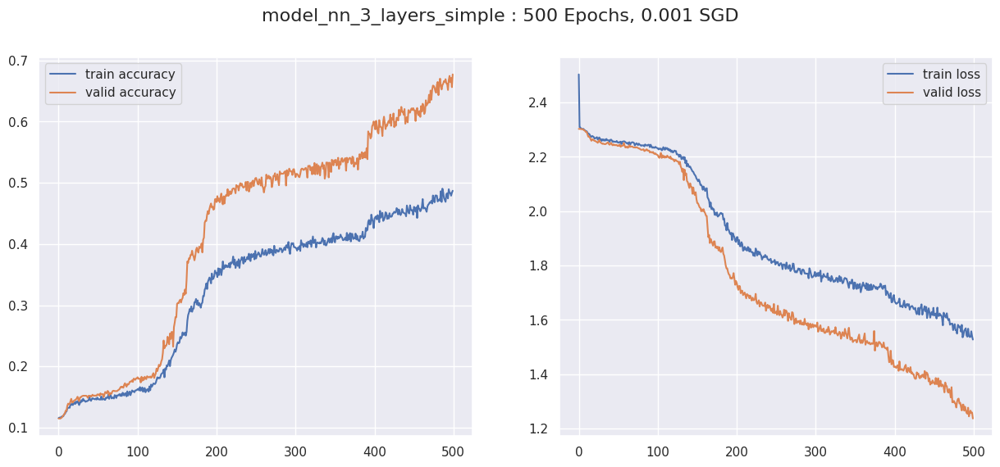

In [73]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,6))

fig.suptitle(f"model_nn_3_layers_simple : 500 Epochs, 0.001 SGD", fontsize=16)
ax1.plot(history5['train_acc'], label='train accuracy')
ax1.plot(history5['valid_acc'], label='valid accuracy')
ax1.legend()


ax2.plot(history5['train_loss'], label='train loss')
ax2.plot(history5['valid_loss'], label='valid loss')
ax2.legend()

fig.show()

In [74]:
model_3_layers = NNModel_3Layers(input_size, output_size)
history6 = fit(model_3_layers, train_dl, test_dl, 500, 0.001, optim=torch.optim.Adam)

Epoch : 0, Train Loss : 2.38, Train Accuracy : 0.12, Validation Loss : 2.27, Validation Accuracy : 0.13
Epoch : 1, Train Loss : 2.27, Train Accuracy : 0.14, Validation Loss : 2.26, Validation Accuracy : 0.14
Epoch : 2, Train Loss : 2.26, Train Accuracy : 0.15, Validation Loss : 2.23, Validation Accuracy : 0.16
Epoch : 3, Train Loss : 2.25, Train Accuracy : 0.15, Validation Loss : 2.22, Validation Accuracy : 0.17
Epoch : 4, Train Loss : 2.23, Train Accuracy : 0.15, Validation Loss : 2.20, Validation Accuracy : 0.17
Epoch : 5, Train Loss : 2.23, Train Accuracy : 0.15, Validation Loss : 2.18, Validation Accuracy : 0.18
Epoch : 6, Train Loss : 2.22, Train Accuracy : 0.16, Validation Loss : 2.18, Validation Accuracy : 0.18
Epoch : 7, Train Loss : 2.22, Train Accuracy : 0.16, Validation Loss : 2.19, Validation Accuracy : 0.17
Epoch : 8, Train Loss : 2.22, Train Accuracy : 0.16, Validation Loss : 2.18, Validation Accuracy : 0.17
Epoch : 9, Train Loss : 2.22, Train Accuracy : 0.16, Validation 

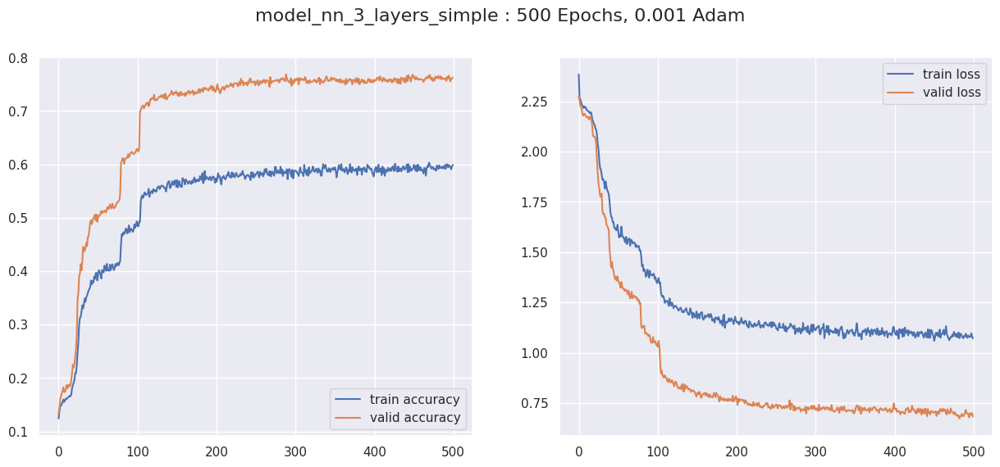

In [75]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,6))

fig.suptitle(f"model_nn_3_layers_simple : 500 Epochs, 0.001 Adam", fontsize=16)
ax1.plot(history6['train_acc'], label='train accuracy')
ax1.plot(history6['valid_acc'], label='valid accuracy')
ax1.legend()


ax2.plot(history6['train_loss'], label='train loss')
ax2.plot(history6['valid_loss'], label='valid loss')
ax2.legend()

fig.show()

In [76]:
model_3_layers = NNModel_3Layers(input_size, output_size)
history7 = fit(model_3_layers, train_dl, test_dl, 500, 3e-4, optim=torch.optim.Adam)

Epoch : 0, Train Loss : 2.80, Train Accuracy : 0.12, Validation Loss : 2.29, Validation Accuracy : 0.13
Epoch : 1, Train Loss : 2.29, Train Accuracy : 0.13, Validation Loss : 2.27, Validation Accuracy : 0.14
Epoch : 2, Train Loss : 2.27, Train Accuracy : 0.14, Validation Loss : 2.25, Validation Accuracy : 0.15
Epoch : 3, Train Loss : 2.25, Train Accuracy : 0.15, Validation Loss : 2.23, Validation Accuracy : 0.16
Epoch : 4, Train Loss : 2.24, Train Accuracy : 0.16, Validation Loss : 2.22, Validation Accuracy : 0.17
Epoch : 5, Train Loss : 2.23, Train Accuracy : 0.16, Validation Loss : 2.20, Validation Accuracy : 0.19
Epoch : 6, Train Loss : 2.20, Train Accuracy : 0.18, Validation Loss : 2.17, Validation Accuracy : 0.21
Epoch : 7, Train Loss : 2.18, Train Accuracy : 0.20, Validation Loss : 2.10, Validation Accuracy : 0.24
Epoch : 8, Train Loss : 2.15, Train Accuracy : 0.21, Validation Loss : 2.08, Validation Accuracy : 0.25
Epoch : 9, Train Loss : 2.13, Train Accuracy : 0.22, Validation 

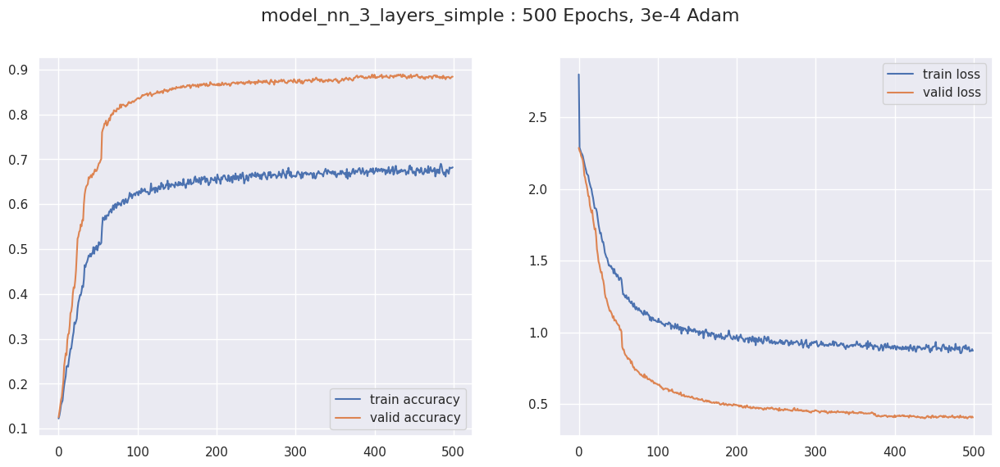

In [77]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,6))

fig.suptitle(f"model_nn_3_layers_simple : 500 Epochs, 3e-4 Adam", fontsize=16)
ax1.plot(history7['train_acc'], label='train accuracy')
ax1.plot(history7['valid_acc'], label='valid accuracy')
ax1.legend()


ax2.plot(history7['train_loss'], label='train loss')
ax2.plot(history7['valid_loss'], label='valid loss')
ax2.legend()

fig.show()

In [78]:
model_6_layers = NNModel_6Layers(input_size, output_size)
history8 = fit(model_6_layers, train_dl, test_dl, 500, 0.001, optim=torch.optim.SGD)

Epoch : 0, Train Loss : 2.31, Train Accuracy : 0.10, Validation Loss : 2.30, Validation Accuracy : 0.10
Epoch : 1, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.28, Validation Accuracy : 0.11
Epoch : 2, Train Loss : 2.29, Train Accuracy : 0.11, Validation Loss : 2.26, Validation Accuracy : 0.13
Epoch : 3, Train Loss : 2.28, Train Accuracy : 0.12, Validation Loss : 2.25, Validation Accuracy : 0.14
Epoch : 4, Train Loss : 2.27, Train Accuracy : 0.13, Validation Loss : 2.23, Validation Accuracy : 0.16
Epoch : 5, Train Loss : 2.26, Train Accuracy : 0.14, Validation Loss : 2.22, Validation Accuracy : 0.16
Epoch : 6, Train Loss : 2.26, Train Accuracy : 0.14, Validation Loss : 2.21, Validation Accuracy : 0.19
Epoch : 7, Train Loss : 2.26, Train Accuracy : 0.14, Validation Loss : 2.21, Validation Accuracy : 0.18
Epoch : 8, Train Loss : 2.25, Train Accuracy : 0.15, Validation Loss : 2.20, Validation Accuracy : 0.20
Epoch : 9, Train Loss : 2.24, Train Accuracy : 0.16, Validation 

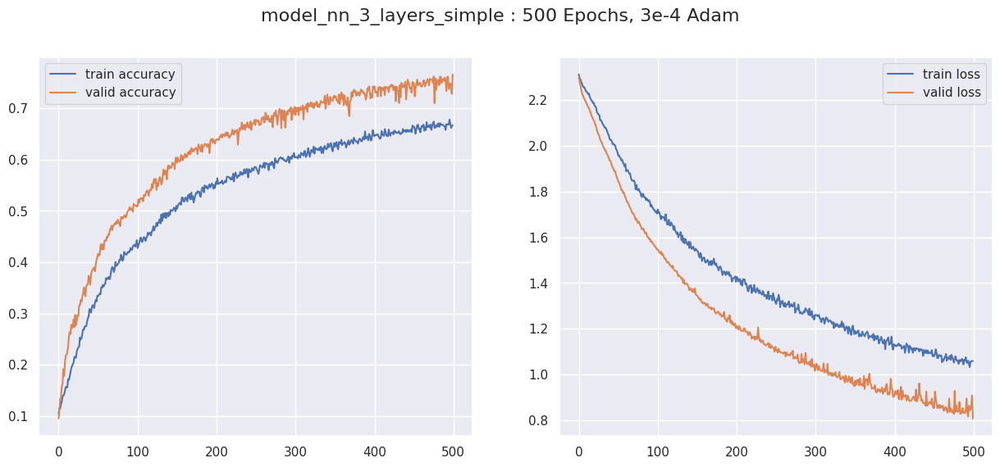

In [79]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,6))

fig.suptitle(f"model_nn_3_layers_simple : 500 Epochs, 3e-4 Adam", fontsize=16)
ax1.plot(history8['train_acc'], label='train accuracy')
ax1.plot(history8['valid_acc'], label='valid accuracy')
ax1.legend()


ax2.plot(history8['train_loss'], label='train loss')
ax2.plot(history8['valid_loss'], label='valid loss')
ax2.legend()

fig.show()

## Inference

In [80]:
metadata.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


In [81]:
featuresdf.head()

,feature,class_label,class_category,feature_len
0,"[-211.9369812012, 62.5812149048, -122.81315612...",dog_bark,3,40
1,"[-417.0051879883, 99.3366241455, -42.995586395...",children_playing,2,40
2,"[-452.393157959, 112.3625335693, -37.578075408...",children_playing,2,40
3,"[-406.4792175293, 91.1966018677, -25.043556213...",children_playing,2,40
4,"[-439.6387329102, 103.8622283936, -42.65878677...",children_playing,2,40


In [82]:
meta_feature = pd.concat([metadata, featuresdf], axis=1)

In [94]:
meta_feature.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class,feature,class_label,class_category,feature_len
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark,"[-211.9369812012, 62.5812149048, -122.81315612...",dog_bark,3,40
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing,"[-417.0051879883, 99.3366241455, -42.995586395...",children_playing,2,40
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing,"[-452.393157959, 112.3625335693, -37.578075408...",children_playing,2,40
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing,"[-406.4792175293, 91.1966018677, -25.043556213...",children_playing,2,40
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing,"[-439.6387329102, 103.8622283936, -42.65878677...",children_playing,2,40


Epoch : 0, Train Loss : 2.34, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.12
Epoch : 1, Train Loss : 2.30, Train Accuracy : 0.12, Validation Loss : 2.30, Validation Accuracy : 0.12
Epoch : 2, Train Loss : 2.30, Train Accuracy : 0.13, Validation Loss : 2.30, Validation Accuracy : 0.12
Epoch : 3, Train Loss : 2.30, Train Accuracy : 0.13, Validation Loss : 2.28, Validation Accuracy : 0.17
Epoch : 4, Train Loss : 2.29, Train Accuracy : 0.14, Validation Loss : 2.29, Validation Accuracy : 0.17
Epoch : 5, Train Loss : 2.29, Train Accuracy : 0.14, Validation Loss : 2.26, Validation Accuracy : 0.22
Epoch : 6, Train Loss : 2.28, Train Accuracy : 0.15, Validation Loss : 2.24, Validation Accuracy : 0.20
Epoch : 7, Train Loss : 2.26, Train Accuracy : 0.17, Validation Loss : 2.19, Validation Accuracy : 0.21
Epoch : 8, Train Loss : 2.23, Train Accuracy : 0.18, Validation Loss : 2.14, Validation Accuracy : 0.24
Epoch : 9, Train Loss : 2.20, Train Accuracy : 0.20, Validation 

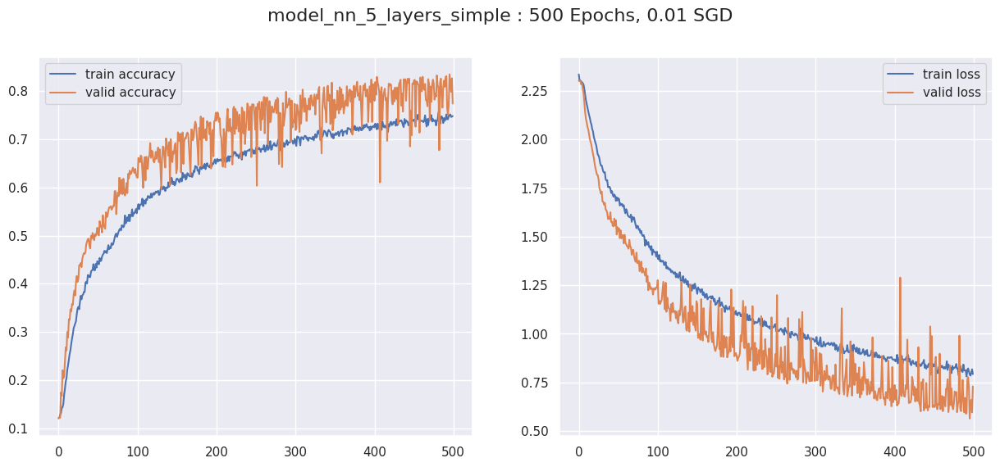

In [95]:
model_5_layers = NNModel_5Layers(input_size, output_size)
history4 = fit(model_5_layers, train_dl, test_dl, 500, 0.001, optim=torch.optim.SGD)
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,6))

fig.suptitle(f"model_nn_5_layers_simple : 500 Epochs, 0.001 SGD", fontsize=16)
ax1.plot(history4['train_acc'], label='train accuracy')
ax1.plot(history4['valid_acc'], label='valid accuracy')
ax1.legend()


ax2.plot(history4['train_loss'], label='train loss')
ax2.plot(history4['valid_loss'], label='valid loss')
ax2.legend()

fig.show()

**Finally using model_5_layers.**

Creating Noise to Index Mapping and Vice-Versa.

In [99]:
meta_feature.loc[:,["class_label", "class_category"]]

,class_label,class_category
0,dog_bark,3
1,children_playing,2
2,children_playing,2
3,children_playing,2
4,children_playing,2
...,...,...
8727,car_horn,1
8728,car_horn,1
8729,car_horn,1
8730,car_horn,1


In [83]:
noise_2_idx = dict(set(meta_feature[['class_label', 'class_category']].to_records(index=False).tolist()))
idx_2_noise = { idx : noise for noise,idx in noise_2_idx.items()}

In [84]:
random_samples = meta_feature.sample(5)
msfcc_feature, labels = random_samples.feature.values.tolist(), random_samples.class_category.values.tolist() 

In [85]:
random_samples

,slice_file_name,fsID,start,end,salience,fold,classID,class,feature,class_label,class_category,feature_len
7123,62837-7-0-8.wav,62837,4.000000,8.000000,1,3,7,jackhammer,"[-88.0343475342, 98.059387207, -12.8997497559,...",jackhammer,7,40
6547,47019-2-0-69.wav,47019,34.500000,38.500000,1,4,2,children_playing,"[-209.8144378662, 28.9752445221, -134.03643798...",children_playing,2,40
4508,184805-0-0-90.wav,184805,45.000000,49.000000,2,6,0,air_conditioner,"[-300.6715087891, 152.8262329102, -8.255531311...",air_conditioner,0,40
7338,69598-4-7-0.wav,69598,60.201304,64.201304,1,3,4,drilling,"[-255.3145294189, 173.7547302246, -101.4098815...",drilling,4,40
4777,189985-0-0-4.wav,189985,2.000000,6.000000,1,10,0,air_conditioner,"[-120.5749664307, 124.2669219971, -9.903508186...",air_conditioner,0,40


In [101]:
msfcc_feature = torch.tensor(msfcc_feature)
labels = torch.tensor(labels)

print(msfcc_feature.shape, labels.shape)

torch.Size([5, 40]) torch.Size([5])


<ipython-input-101-544b828427f5>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  msfcc_feature = torch.tensor(msfcc_feature)


In [102]:
model_5_layers

NNModel_5Layers(
  (block1): Sequential(
    (0): Linear(in_features=40, out_features=128, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
  )
  (block2): Sequential(
    (0): Linear(in_features=128, out_features=128, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
  )
  (block3): Sequential(
    (0): Linear(in_features=128, out_features=256, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
  )
  (block4): Sequential(
    (0): Linear(in_features=256, out_features=256, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
  )
  (block5): Sequential(
    (0): Linear(in_features=256, out_features=10, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.1, inplace=False)
  )
)

In [87]:
outputs = model_5_layers(msfcc_feature)

output_softmaxed = F.softmax(outputs, dim=1)
_, preds = torch.max(output_softmaxed, dim=1)

preds = preds.numpy().tolist()
preds_labels = [idx_2_noise[pred] for pred in preds]


labels = labels.numpy().tolist()
labels_names = [idx_2_noise[label] for label in labels]

## Final Inferences

In [108]:
random_samples.iloc[0]

slice_file_name                                      62837-7-0-8.wav
fsID                                                           62837
start                                                            4.0
end                                                              8.0
salience                                                           1
fold                                                               3
classID                                                            7
class                                                     jackhammer
feature            [-88.0343475342, 98.059387207, -12.8997497559,...
class_label                                               jackhammer
class_category                                                     7
feature_len                                                       40
Name: 7123, dtype: object

In [104]:
f"/content/UrbanSound8K/audio/fold{random_samples.iloc[0].values[5]}/" + random_samples.iloc[0].values[0]

'/content/UrbanSound8K/audio/fold3/62837-7-0-8.wav'

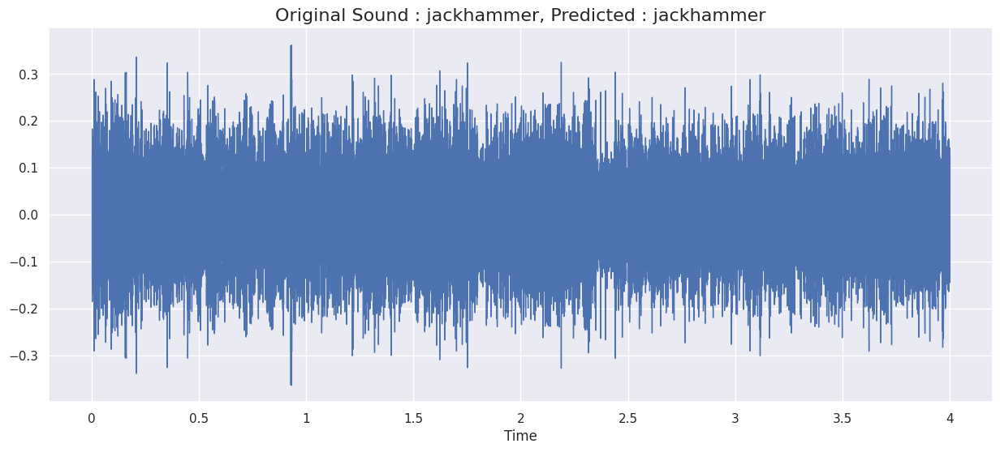

In [88]:
audio_path = f"/content/UrbanSound8K/audio/fold{random_samples.iloc[0].values[5]}/" + random_samples.iloc[0].values[0]
data, sr = librosa.load(audio_path)

plt.figure(figsize=(15,6))
_ = librosa.display.waveshow(data)

plt.title(f"Original Sound : {labels_names[0]}, Predicted : {preds_labels[0]}", fontsize=16)
ipd.Audio(audio_path)

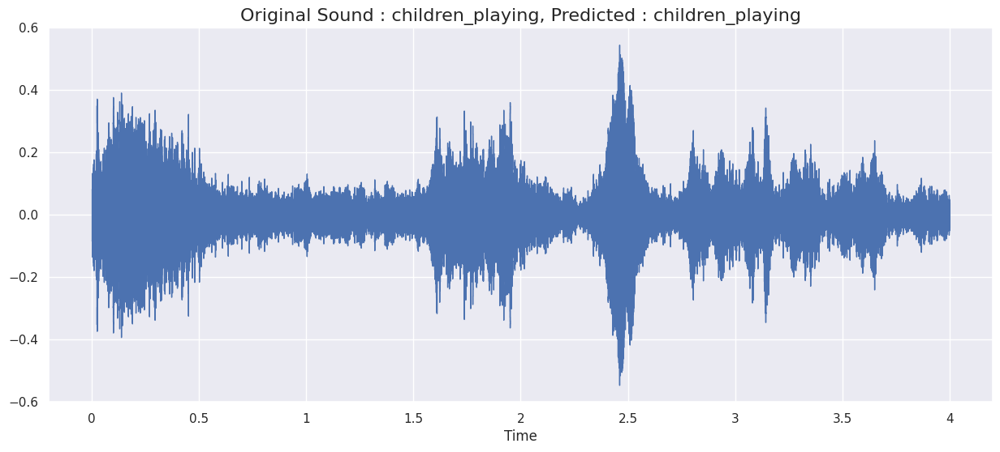

In [89]:
idx = 1
audio_path = f"/content/UrbanSound8K/audio/fold{random_samples.iloc[idx].values[5]}/" + random_samples.iloc[idx].values[0]
data, sr = librosa.load(audio_path)

plt.figure(figsize=(15,6))
_ = librosa.display.waveshow(data)

plt.title(f"Original Sound : {labels_names[idx]}, Predicted : {preds_labels[idx]}", fontsize=16)
ipd.Audio(audio_path)

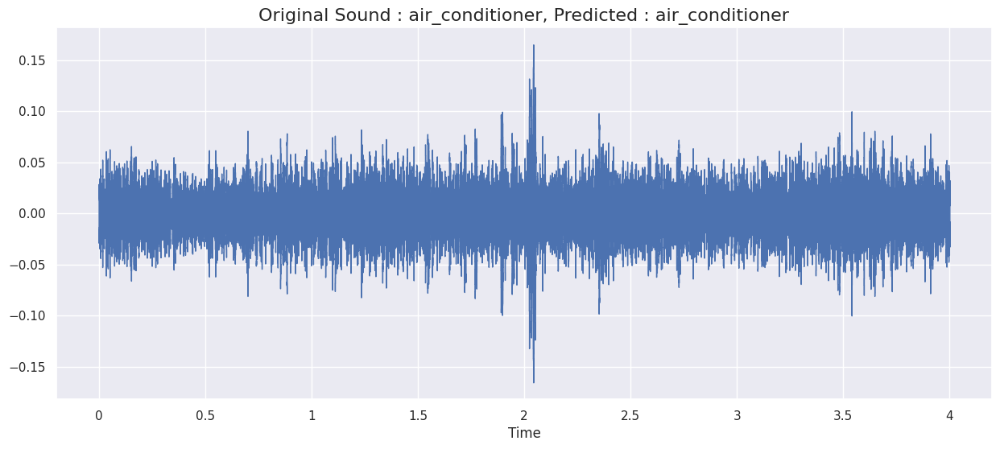

In [90]:
idx = 2
audio_path = f"/content/UrbanSound8K/audio/fold{random_samples.iloc[idx].values[5]}/" + random_samples.iloc[idx].values[0]
data, sr = librosa.load(audio_path)

plt.figure(figsize=(15,6))
_ = librosa.display.waveshow(data)

plt.title(f"Original Sound : {labels_names[idx]}, Predicted : {preds_labels[idx]}", fontsize=16)
ipd.Audio(audio_path)

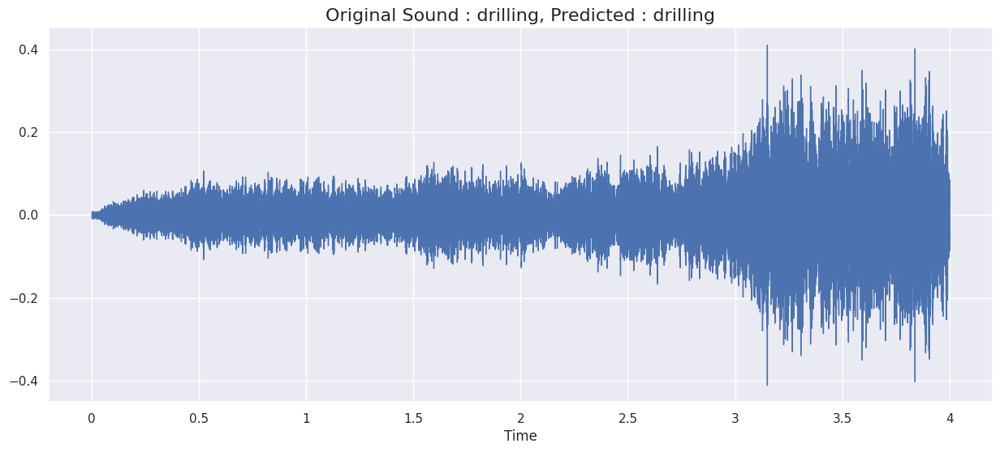

In [91]:
idx = 3
audio_path = f"/content/UrbanSound8K/audio/fold{random_samples.iloc[idx].values[5]}/" + random_samples.iloc[idx].values[0]
data, sr = librosa.load(audio_path)

plt.figure(figsize=(15,6))
_ = librosa.display.waveshow(data)

plt.title(f"Original Sound : {labels_names[idx]}, Predicted : {preds_labels[idx]}", fontsize=16)
ipd.Audio(audio_path)

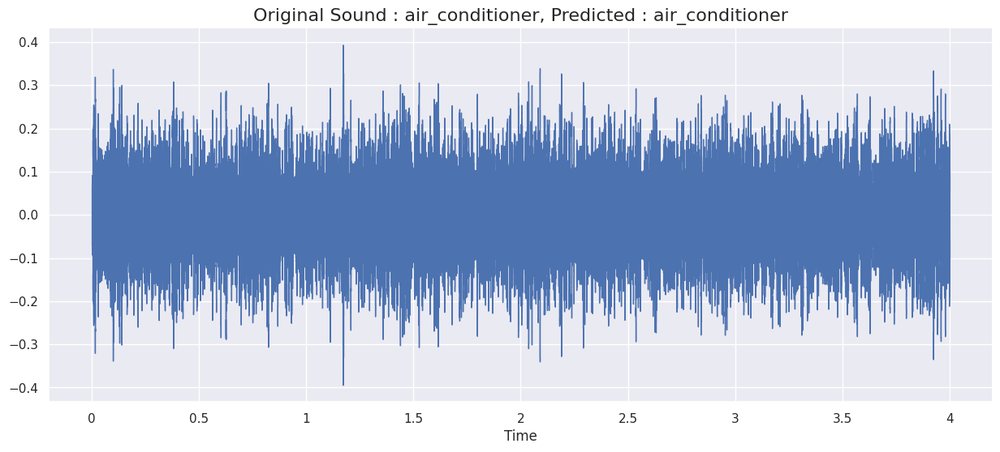

In [92]:
idx = 4
audio_path = f"/content/UrbanSound8K/audio/fold{random_samples.iloc[idx].values[5]}/" + random_samples.iloc[idx].values[0]
data, sr = librosa.load(audio_path)

plt.figure(figsize=(15,6))
_ = librosa.display.waveshow(data)

plt.title(f"Original Sound : {labels_names[idx]}, Predicted : {preds_labels[idx]}", fontsize=16)
ipd.Audio(audio_path)

# Future Scope and Other Methods to Try:
* MFCC is not the only feature that can be utilized in audio analysis, beside that you can try Volume, Energy, Pitch, Zero Crossing Rate, Spectral Centroid etc as additional features along with it.

* Instead of extracting features via MFCC, feature reduction technique such as t-SNE or PCA can be used as well."